In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented/"
x = load(os.path.join(path, 'train/Train_3221.jpg'))
print(x.shape)

(300, 300, 3)


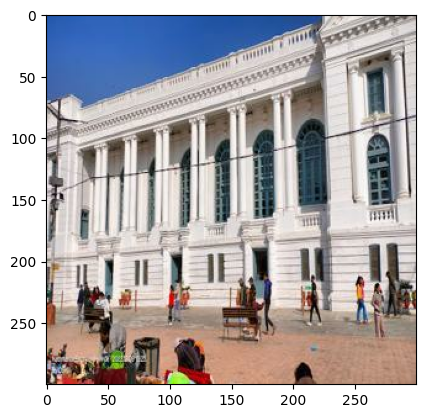

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

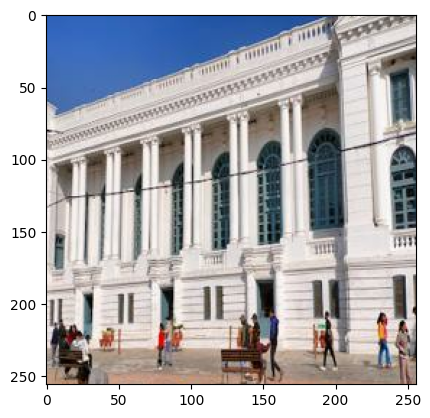

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

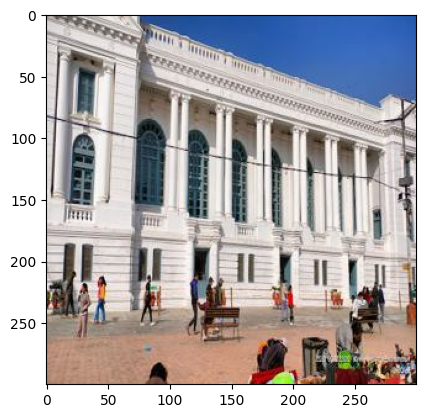

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [16]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [17]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [18]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [19]:
validation_dataset = tf.data.Dataset.list_files(path + 'val/*.jpg')
validation_dataset = validation_dataset.map(load_test_image)
validation_dataset = validation_dataset.batch(BATCH_SIZE)
validation_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [20]:
test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
test_dataset = test_dataset.map(load_test_image)
test_dataset = test_dataset.batch(1)
test_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [21]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 150, 3)


In [22]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 300, 3)


In [23]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

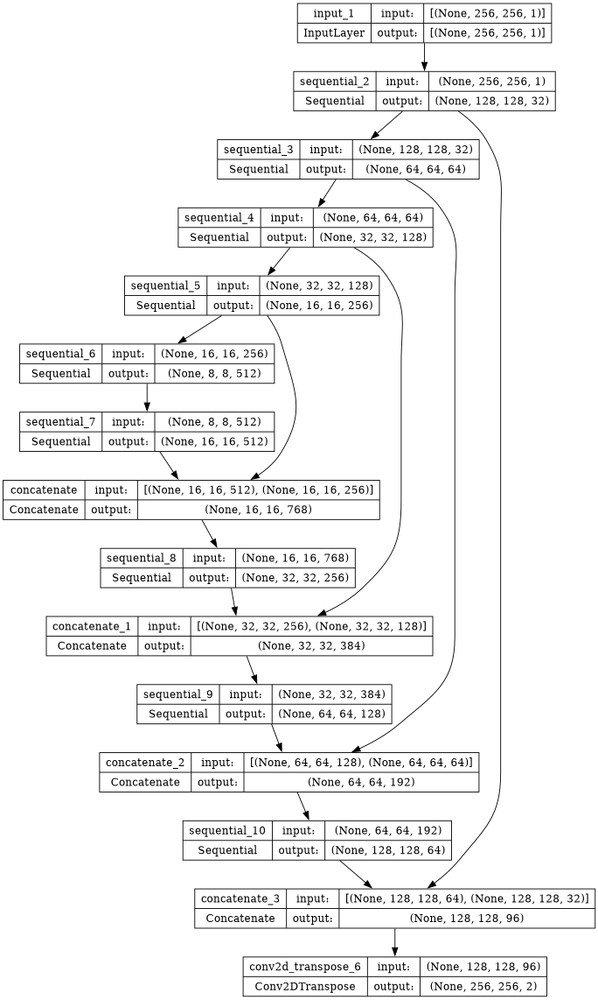

In [24]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [25]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

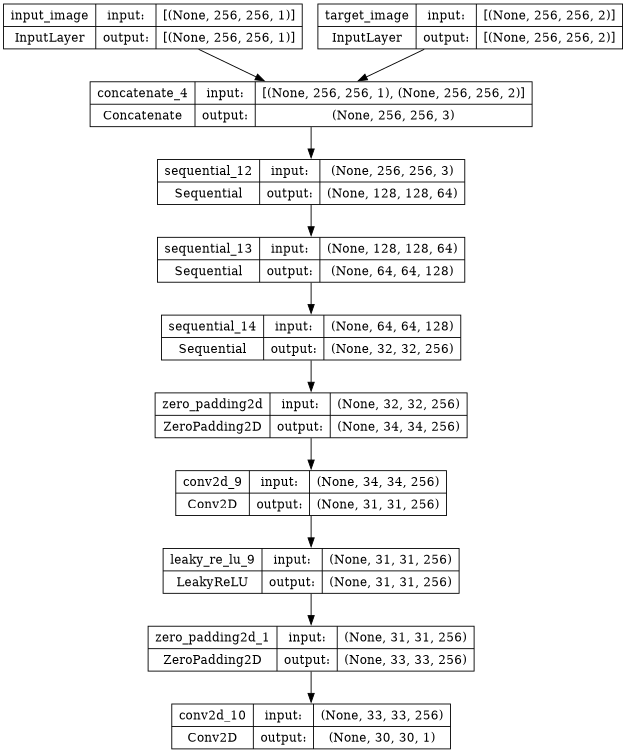

In [26]:
disc = discriminator()
plot_model(disc, show_shapes=True, dpi = 64)

In [27]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [28]:
LAMBDA = 50

In [29]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [30]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 80*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [31]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [32]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [33]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [34]:
epochs = 250

In [35]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [36]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [37]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [38]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [39]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [40]:
os.mkdir('/kaggle/working/gen_output/')

In [41]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [42]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


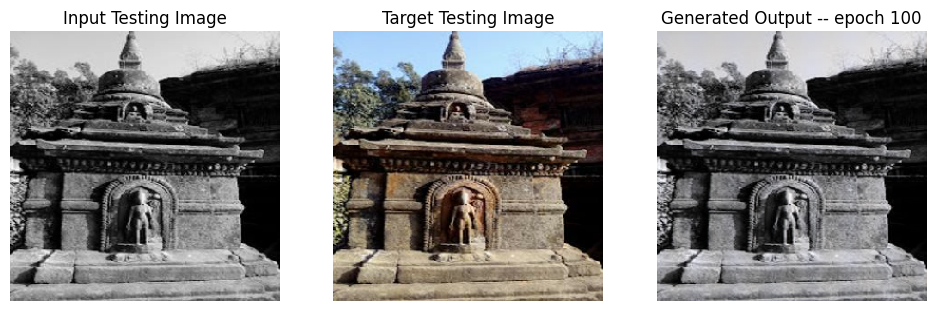

SSIM Score: 0.9601224064826965
PSNR Score: 24.099502563476562


In [43]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_1020.jpg',100)

In [44]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for epoch in range(epochs):
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 39000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_1030.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if epoch > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [45]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 0s 0us/step
Training Details
Generator-- total_loss:3.99324 gan_loss:0.96656 l1_loss:0.04613 perceptual_loss:0.00900 Discriminator-- total_loss:1.59389 real_loss:0.80845 generated_loss:0.78545 --- SSIM 0.84376 PSNR 22.60583 LPIPS 0.00000
Time taken for epoch 1 is 590.3258814811707 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.99777 gan_loss:0.64211 l1_loss:0.05135  perceptual_loss:0.00985 Discriminator-- total_loss:1.43371 real_loss:0.78337 generated_loss:0.65034 --- SSIM 0.92105 PSNR 22.25591 LPIPS 0.00000
Time taken for epoch 1 is 679.4443278312683 sec
Number of iteration 140
Displaying one random test image...


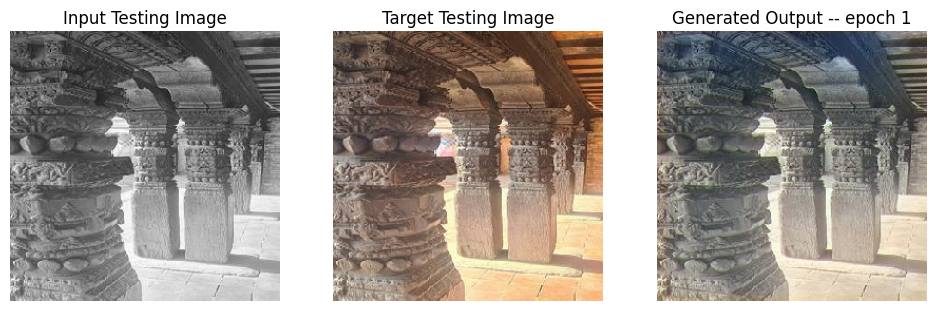

SSIM Score: 0.9596788287162781
PSNR Score: 22.33837127685547
Epoch 1
Training Details
Generator-- total_loss:3.42245 gan_loss:0.80658 l1_loss:0.04067 perceptual_loss:0.00728 Discriminator-- total_loss:1.34753 real_loss:0.66920 generated_loss:0.67833 --- SSIM 0.89995 PSNR 23.46981 LPIPS 0.00000
Time taken for epoch 2 is 583.5091710090637 sec
Number of iteration 490
Validation Details
Generator-- total_loss:4.60084 gan_loss:0.58460 l1_loss:0.06514  perceptual_loss:0.00949 Discriminator-- total_loss:1.43843 real_loss:0.84798 generated_loss:0.59045 --- SSIM 0.91214 PSNR 20.04059 LPIPS 0.00000
Time taken for epoch 2 is 672.9808852672577 sec
Number of iteration 140
Epoch 2
Training Details
Generator-- total_loss:3.39168 gan_loss:0.81336 l1_loss:0.04021 perceptual_loss:0.00710 Discriminator-- total_loss:1.35367 real_loss:0.67251 generated_loss:0.68116 --- SSIM 0.91241 PSNR 23.48236 LPIPS 0.00000
Time taken for epoch 3 is 584.6679975986481 sec
Number of iteration 490
Validation Details
Generat

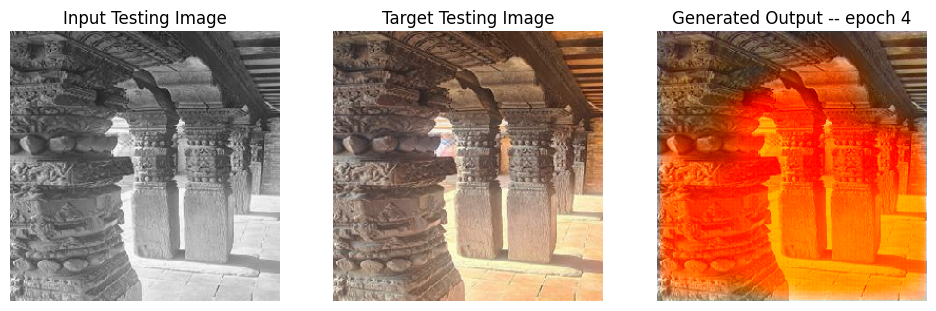

SSIM Score: 0.4915769398212433
PSNR Score: 4.402216911315918
Epoch 4
Training Details
Generator-- total_loss:3.57757 gan_loss:0.85255 l1_loss:0.04225 perceptual_loss:0.00766 Discriminator-- total_loss:1.32696 real_loss:0.66002 generated_loss:0.66694 --- SSIM 0.91677 PSNR 23.05448 LPIPS 0.00000
Time taken for epoch 5 is 583.5166964530945 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.79048 gan_loss:0.79994 l1_loss:0.04563  perceptual_loss:0.00886 Discriminator-- total_loss:1.31384 real_loss:0.64306 generated_loss:0.67078 --- SSIM 0.92974 PSNR 22.81319 LPIPS 0.00000
Time taken for epoch 5 is 674.4508357048035 sec
Number of iteration 140
Epoch 5
Training Details
Generator-- total_loss:3.41067 gan_loss:0.80172 l1_loss:0.04044 perceptual_loss:0.00734 Discriminator-- total_loss:1.33574 real_loss:0.66186 generated_loss:0.67388 --- SSIM 0.92261 PSNR 23.28610 LPIPS 0.00000
Time taken for epoch 6 is 575.6670124530792 sec
Number of iteration 490
Validation Details
Generat

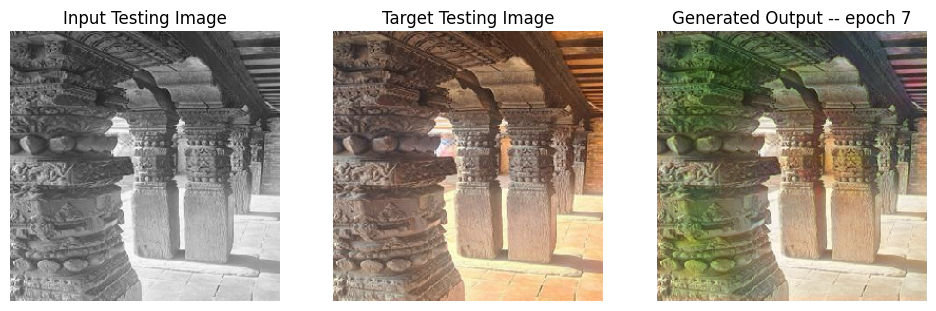

SSIM Score: 0.9632446765899658
PSNR Score: 23.58743667602539
Epoch 7
Training Details
Generator-- total_loss:3.35333 gan_loss:0.81338 l1_loss:0.03946 perceptual_loss:0.00709 Discriminator-- total_loss:1.33393 real_loss:0.66108 generated_loss:0.67286 --- SSIM 0.92743 PSNR 23.48719 LPIPS 0.00000
Time taken for epoch 8 is 582.4858222007751 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.15280 gan_loss:0.45767 l1_loss:0.04126  perceptual_loss:0.00790 Discriminator-- total_loss:1.53593 real_loss:1.08565 generated_loss:0.45028 --- SSIM 0.93802 PSNR 23.78080 LPIPS 0.00000
Time taken for epoch 8 is 672.9608619213104 sec
Number of iteration 140
Epoch 8
Training Details
Generator-- total_loss:3.35534 gan_loss:0.81500 l1_loss:0.03951 perceptual_loss:0.00706 Discriminator-- total_loss:1.33807 real_loss:0.66478 generated_loss:0.67329 --- SSIM 0.92798 PSNR 23.46813 LPIPS 0.00000
Time taken for epoch 9 is 576.4433782100677 sec
Number of iteration 490
Validation Details
Generat

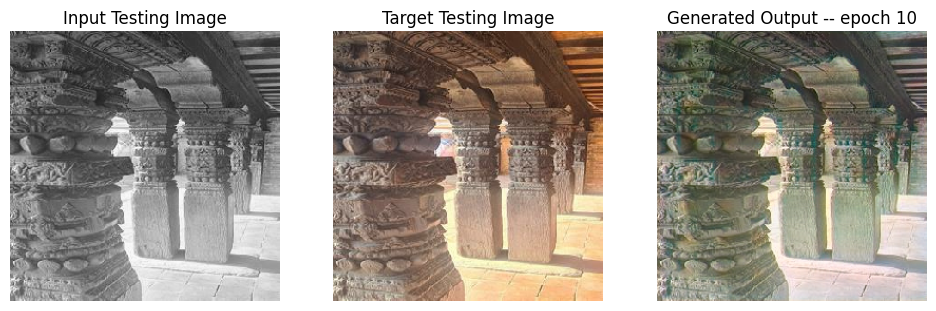

SSIM Score: 0.9631893634796143
PSNR Score: 22.595125198364258
Epoch 10
Training Details
Generator-- total_loss:2.88521 gan_loss:0.46112 l1_loss:0.03782 perceptual_loss:0.00667 Discriminator-- total_loss:1.84379 real_loss:1.12513 generated_loss:0.71865 --- SSIM 0.93866 PSNR 23.81237 LPIPS 0.00000
Time taken for epoch 11 is 528.3582692146301 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.34683 gan_loss:0.46188 l1_loss:0.04459  perceptual_loss:0.00819 Discriminator-- total_loss:1.84099 real_loss:1.08732 generated_loss:0.75368 --- SSIM 0.93611 PSNR 22.72927 LPIPS 0.00000
Time taken for epoch 11 is 618.0460925102234 sec
Number of iteration 140
Epoch 11
Training Details
Generator-- total_loss:9.79050 gan_loss:7.39710 l1_loss:0.03745 perceptual_loss:0.00651 Discriminator-- total_loss:0.78360 real_loss:0.37994 generated_loss:0.40366 --- SSIM 0.93994 PSNR 23.86489 LPIPS 0.00000
Time taken for epoch 12 is 401.48397517204285 sec
Number of iteration 490
Validation Details


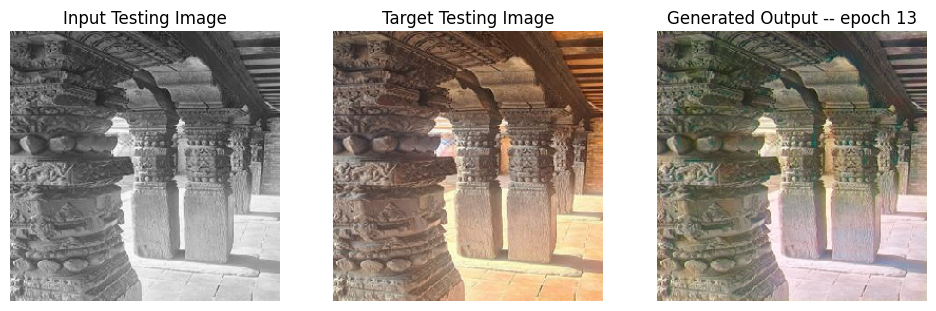

SSIM Score: 0.9682953953742981
PSNR Score: 23.060592651367188
Epoch 13
Training Details
Generator-- total_loss:13.20975 gan_loss:10.81828 l1_loss:0.03741 perceptual_loss:0.00651 Discriminator-- total_loss:0.01206 real_loss:0.00672 generated_loss:0.00534 --- SSIM 0.94014 PSNR 23.87153 LPIPS 0.00000
Time taken for epoch 14 is 404.63029623031616 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.96417 gan_loss:1.19723 l1_loss:0.04303  perceptual_loss:0.00769 Discriminator-- total_loss:2.28742 real_loss:1.39913 generated_loss:0.88829 --- SSIM 0.93865 PSNR 23.10937 LPIPS 0.00000
Time taken for epoch 14 is 496.81538009643555 sec
Number of iteration 140
Epoch 14
Training Details
Generator-- total_loss:14.32552 gan_loss:11.93735 l1_loss:0.03737 perceptual_loss:0.00650 Discriminator-- total_loss:0.00136 real_loss:0.00066 generated_loss:0.00070 --- SSIM 0.94010 PSNR 23.87594 LPIPS 0.00000
Time taken for epoch 15 is 403.29549288749695 sec
Number of iteration 490
Validation De

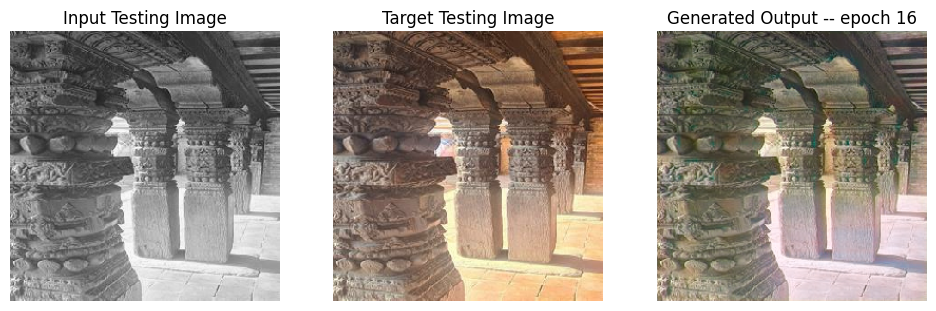

SSIM Score: 0.9682397842407227
PSNR Score: 23.076805114746094
Epoch 16
Training Details
Generator-- total_loss:15.09189 gan_loss:12.70322 l1_loss:0.03737 perceptual_loss:0.00650 Discriminator-- total_loss:0.00194 real_loss:0.00090 generated_loss:0.00104 --- SSIM 0.94026 PSNR 23.88245 LPIPS 0.00000
Time taken for epoch 17 is 406.4820442199707 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.83271 gan_loss:1.06589 l1_loss:0.04303  perceptual_loss:0.00769 Discriminator-- total_loss:1.89500 real_loss:0.75230 generated_loss:1.14270 --- SSIM 0.93875 PSNR 23.11665 LPIPS 0.00000
Time taken for epoch 17 is 498.4609532356262 sec
Number of iteration 140
Epoch 17
Training Details
Generator-- total_loss:16.29360 gan_loss:13.90487 l1_loss:0.03738 perceptual_loss:0.00650 Discriminator-- total_loss:0.00044 real_loss:0.00020 generated_loss:0.00024 --- SSIM 0.94002 PSNR 23.88449 LPIPS 0.00000
Time taken for epoch 18 is 400.2272398471832 sec
Number of iteration 490
Validation Detai

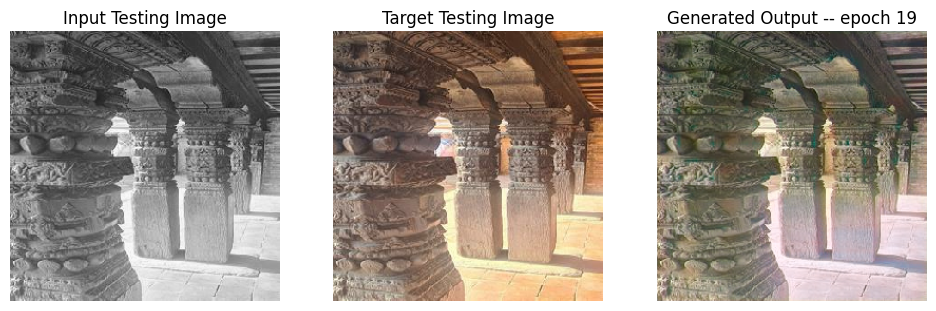

SSIM Score: 0.9683429598808289
PSNR Score: 23.066516876220703
Epoch 19
Training Details
Generator-- total_loss:16.76225 gan_loss:14.37176 l1_loss:0.03741 perceptual_loss:0.00650 Discriminator-- total_loss:0.68949 real_loss:0.26896 generated_loss:0.42053 --- SSIM 0.94005 PSNR 23.87104 LPIPS 0.00000
Time taken for epoch 20 is 392.8184335231781 sec
Number of iteration 490
Validation Details
Generator-- total_loss:5.90481 gan_loss:3.13917 l1_loss:0.04300  perceptual_loss:0.00769 Discriminator-- total_loss:1.64880 real_loss:0.50345 generated_loss:1.14535 --- SSIM 0.93877 PSNR 23.11665 LPIPS 0.00000
Time taken for epoch 20 is 482.9635877609253 sec
Number of iteration 140
Epoch 20
Training Details
Generator-- total_loss:14.69709 gan_loss:12.30726 l1_loss:0.03739 perceptual_loss:0.00650 Discriminator-- total_loss:0.00584 real_loss:0.00265 generated_loss:0.00319 --- SSIM 0.93999 PSNR 23.87327 LPIPS 0.00000
Time taken for epoch 21 is 388.63969802856445 sec
Number of iteration 490
Validation Deta

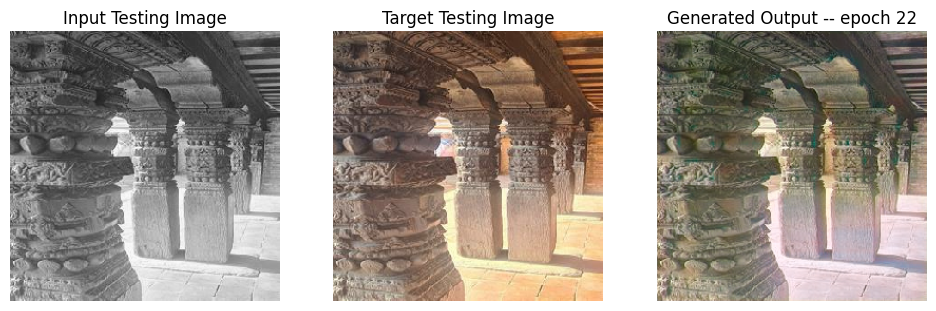

SSIM Score: 0.9682269096374512
PSNR Score: 23.105566024780273
Epoch 22
Training Details
Generator-- total_loss:17.53762 gan_loss:15.14889 l1_loss:0.03738 perceptual_loss:0.00650 Discriminator-- total_loss:0.00129 real_loss:0.00063 generated_loss:0.00065 --- SSIM 0.94015 PSNR 23.87745 LPIPS 0.00000
Time taken for epoch 23 is 383.52140283584595 sec
Number of iteration 490
Validation Details
Generator-- total_loss:4.68177 gan_loss:1.91655 l1_loss:0.04300  perceptual_loss:0.00769 Discriminator-- total_loss:2.02694 real_loss:0.91642 generated_loss:1.11052 --- SSIM 0.93878 PSNR 23.11882 LPIPS 0.00000
Time taken for epoch 23 is 472.4870114326477 sec
Number of iteration 140
Epoch 23
Training Details
Generator-- total_loss:18.13786 gan_loss:15.75030 l1_loss:0.03737 perceptual_loss:0.00649 Discriminator-- total_loss:0.00028 real_loss:0.00012 generated_loss:0.00015 --- SSIM 0.94015 PSNR 23.88184 LPIPS 0.00000
Time taken for epoch 24 is 383.69781947135925 sec
Number of iteration 490
Validation Det

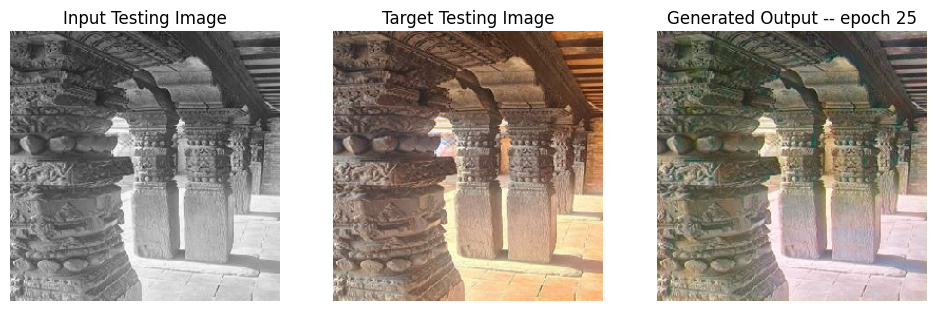

SSIM Score: 0.968309223651886
PSNR Score: 23.1496524810791
Epoch 25
Training Details
Generator-- total_loss:24.08175 gan_loss:21.69323 l1_loss:0.03736 perceptual_loss:0.00651 Discriminator-- total_loss:0.00235 real_loss:0.00098 generated_loss:0.00137 --- SSIM 0.94015 PSNR 23.88536 LPIPS 0.00000
Time taken for epoch 26 is 385.63444805145264 sec
Number of iteration 490
Validation Details
Generator-- total_loss:4.56352 gan_loss:1.79747 l1_loss:0.04302  perceptual_loss:0.00769 Discriminator-- total_loss:2.49571 real_loss:1.86843 generated_loss:0.62728 --- SSIM 0.93869 PSNR 23.11268 LPIPS 0.00000
Time taken for epoch 26 is 475.92304134368896 sec
Number of iteration 140
Epoch 26
Training Details
Generator-- total_loss:24.81323 gan_loss:22.42406 l1_loss:0.03737 perceptual_loss:0.00651 Discriminator-- total_loss:0.00187 real_loss:0.00066 generated_loss:0.00121 --- SSIM 0.94020 PSNR 23.88278 LPIPS 0.00000
Time taken for epoch 27 is 386.8919279575348 sec
Number of iteration 490
Validation Detail

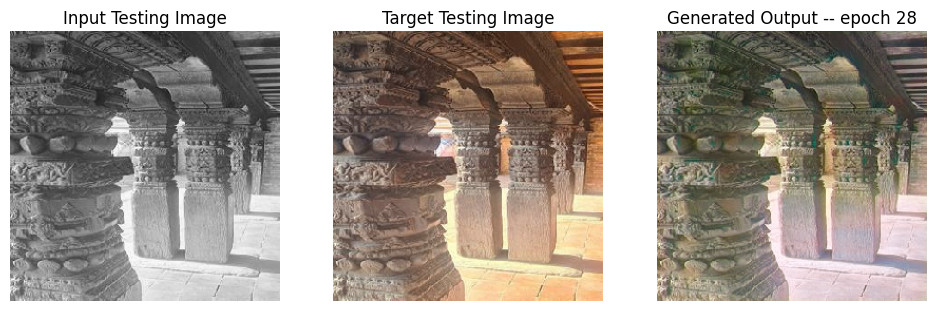

SSIM Score: 0.9682402610778809
PSNR Score: 23.126422882080078
Epoch 28
Training Details
Generator-- total_loss:27.44356 gan_loss:25.05346 l1_loss:0.03738 perceptual_loss:0.00651 Discriminator-- total_loss:0.00326 real_loss:0.00158 generated_loss:0.00168 --- SSIM 0.94012 PSNR 23.88031 LPIPS 0.00000
Time taken for epoch 29 is 389.88012862205505 sec
Number of iteration 490
Validation Details
Generator-- total_loss:4.07469 gan_loss:1.30894 l1_loss:0.04300  perceptual_loss:0.00769 Discriminator-- total_loss:1.88772 real_loss:1.17165 generated_loss:0.71606 --- SSIM 0.93868 PSNR 23.10922 LPIPS 0.00000
Time taken for epoch 29 is 480.8361723423004 sec
Number of iteration 140
Epoch 29
Training Details
Generator-- total_loss:27.94053 gan_loss:25.54797 l1_loss:0.03743 perceptual_loss:0.00652 Discriminator-- total_loss:0.00046 real_loss:0.00020 generated_loss:0.00026 --- SSIM 0.94004 PSNR 23.87249 LPIPS 0.00000
Time taken for epoch 30 is 390.8356590270996 sec
Number of iteration 490
Validation Deta

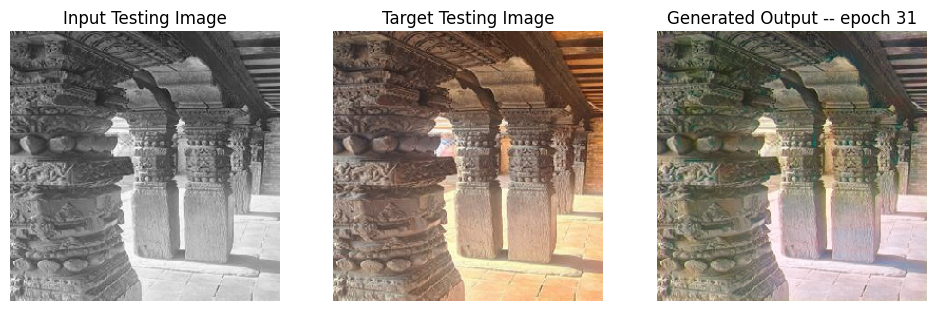

SSIM Score: 0.968238890171051
PSNR Score: 23.03857421875
Epoch 31
Training Details
Generator-- total_loss:28.17517 gan_loss:25.78730 l1_loss:0.03737 perceptual_loss:0.00649 Discriminator-- total_loss:0.00038 real_loss:0.00021 generated_loss:0.00017 --- SSIM 0.94012 PSNR 23.88808 LPIPS 0.00000
Time taken for epoch 32 is 386.60266733169556 sec
Number of iteration 490
Validation Details
Generator-- total_loss:3.51027 gan_loss:0.74435 l1_loss:0.04301  perceptual_loss:0.00769 Discriminator-- total_loss:2.82073 real_loss:2.31026 generated_loss:0.51047 --- SSIM 0.93876 PSNR 23.11553 LPIPS 0.00000
Time taken for epoch 32 is 475.32875752449036 sec
Number of iteration 140
Epoch 32
Training Details
Generator-- total_loss:34.07698 gan_loss:31.68850 l1_loss:0.03736 perceptual_loss:0.00651 Discriminator-- total_loss:0.08318 real_loss:0.03554 generated_loss:0.04764 --- SSIM 0.94011 PSNR 23.88041 LPIPS 0.00000
Time taken for epoch 33 is 391.05214047431946 sec
Number of iteration 490
Validation Details

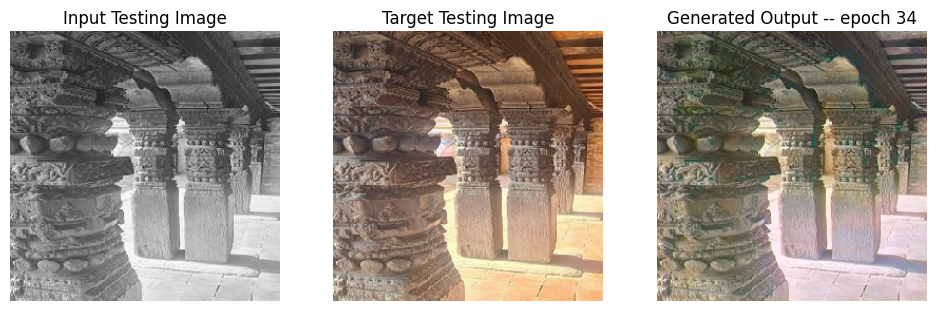

SSIM Score: 0.9682412147521973
PSNR Score: 23.046512603759766
Epoch 34
Training Details
Generator-- total_loss:49.31115 gan_loss:46.92264 l1_loss:0.03738 perceptual_loss:0.00649 Discriminator-- total_loss:0.00067 real_loss:0.00032 generated_loss:0.00035 --- SSIM 0.94015 PSNR 23.87214 LPIPS 0.00000
Time taken for epoch 35 is 388.6811258792877 sec
Number of iteration 490
Validation Details
Generator-- total_loss:7.40295 gan_loss:4.63569 l1_loss:0.04303  perceptual_loss:0.00770 Discriminator-- total_loss:4.51105 real_loss:3.25065 generated_loss:1.26040 --- SSIM 0.93861 PSNR 23.10595 LPIPS 0.00000
Time taken for epoch 35 is 477.54419350624084 sec
Number of iteration 140
Epoch 35
Training Details
Generator-- total_loss:48.65956 gan_loss:46.26709 l1_loss:0.03741 perceptual_loss:0.00652 Discriminator-- total_loss:0.00007 real_loss:0.00003 generated_loss:0.00004 --- SSIM 0.94009 PSNR 23.87701 LPIPS 0.00000
Time taken for epoch 36 is 388.2111806869507 sec
Number of iteration 490
Validation Deta

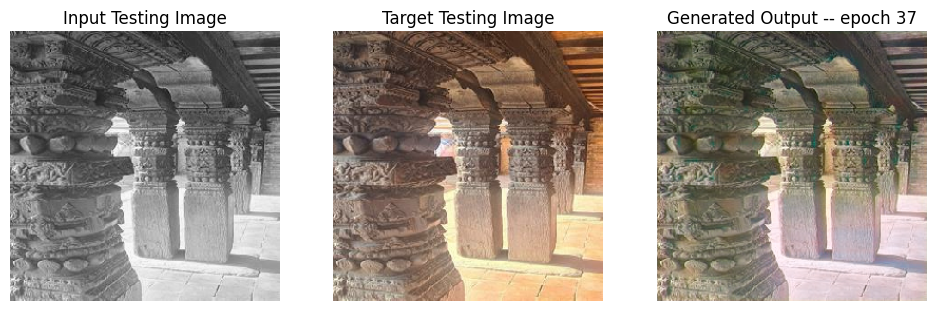

SSIM Score: 0.9682449698448181
PSNR Score: 23.078128814697266
Epoch 37
Training Details
Generator-- total_loss:43.59395 gan_loss:41.20675 l1_loss:0.03734 perceptual_loss:0.00650 Discriminator-- total_loss:0.05781 real_loss:0.03603 generated_loss:0.02178 --- SSIM 0.94024 PSNR 23.88245 LPIPS 0.00000
Time taken for epoch 38 is 392.0354278087616 sec
Number of iteration 490
Validation Details
Generator-- total_loss:7.28550 gan_loss:4.51912 l1_loss:0.04302  perceptual_loss:0.00769 Discriminator-- total_loss:4.29527 real_loss:1.76519 generated_loss:2.53008 --- SSIM 0.93870 PSNR 23.10660 LPIPS 0.00000
Time taken for epoch 38 is 481.22672510147095 sec
Number of iteration 140
Epoch 38
Training Details
Generator-- total_loss:51.20798 gan_loss:48.82047 l1_loss:0.03734 perceptual_loss:0.00650 Discriminator-- total_loss:0.00349 real_loss:0.00101 generated_loss:0.00248 --- SSIM 0.94019 PSNR 23.89219 LPIPS 0.00000
Time taken for epoch 39 is 395.8328902721405 sec
Number of iteration 490
Validation Deta

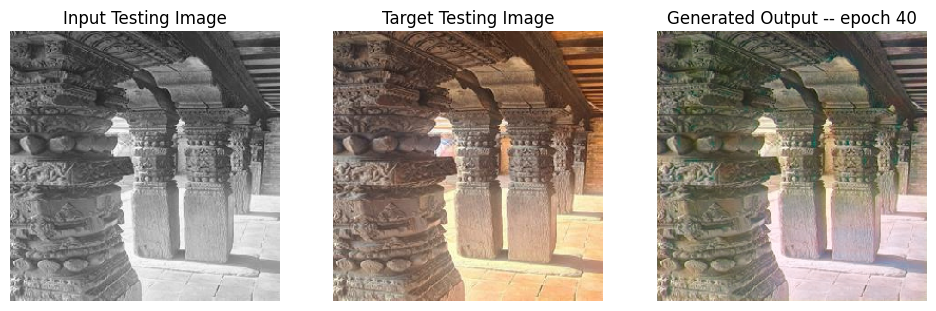

SSIM Score: 0.9682433605194092
PSNR Score: 23.10523223876953
Epoch 40
Training Details
Generator-- total_loss:47.58217 gan_loss:45.19600 l1_loss:0.03733 perceptual_loss:0.00649 Discriminator-- total_loss:0.00005 real_loss:0.00003 generated_loss:0.00002 --- SSIM 0.94033 PSNR 23.88984 LPIPS 0.00000
Time taken for epoch 41 is 393.573082447052 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.84194 gan_loss:0.07600 l1_loss:0.04302  perceptual_loss:0.00769 Discriminator-- total_loss:8.08762 real_loss:7.88320 generated_loss:0.20442 --- SSIM 0.93881 PSNR 23.11657 LPIPS 0.00000
Time taken for epoch 41 is 483.1662516593933 sec
Number of iteration 140
Epoch 41
Training Details
Generator-- total_loss:47.70100 gan_loss:45.31248 l1_loss:0.03737 perceptual_loss:0.00650 Discriminator-- total_loss:0.00003 real_loss:0.00002 generated_loss:0.00001 --- SSIM 0.94006 PSNR 23.88445 LPIPS 0.00000
Time taken for epoch 42 is 395.5095384120941 sec
Number of iteration 490
Validation Details

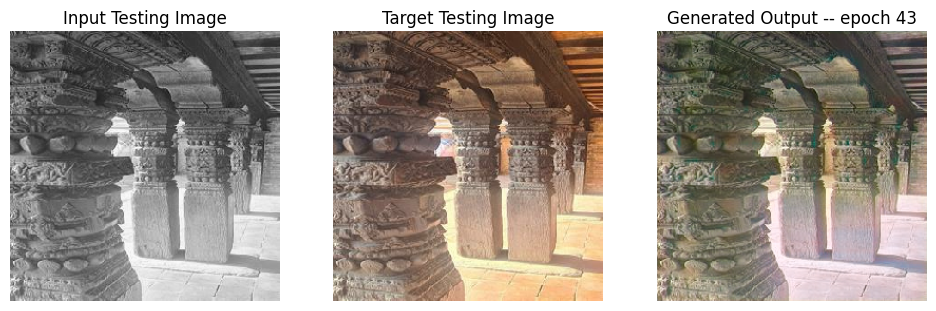

SSIM Score: 0.9683928489685059
PSNR Score: 23.099821090698242
Epoch 43
Training Details
Generator-- total_loss:46.58931 gan_loss:44.20015 l1_loss:0.03737 perceptual_loss:0.00651 Discriminator-- total_loss:0.00002 real_loss:0.00002 generated_loss:0.00000 --- SSIM 0.94018 PSNR 23.88372 LPIPS 0.00000
Time taken for epoch 44 is 397.58515095710754 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.83507 gan_loss:0.07012 l1_loss:0.04299  perceptual_loss:0.00770 Discriminator-- total_loss:7.37381 real_loss:7.18444 generated_loss:0.18937 --- SSIM 0.93881 PSNR 23.11734 LPIPS 0.00000
Time taken for epoch 44 is 490.05915665626526 sec
Number of iteration 140
Reduced generator learning rate to 0.0004500000213738531 at epoch 44
Epoch 44
Training Details
Generator-- total_loss:2.29148 gan_loss:0.09493 l1_loss:0.03375 perceptual_loss:0.00636 Discriminator-- total_loss:43.76014 real_loss:43.76013 generated_loss:0.00001 --- SSIM 0.94578 PSNR 25.09763 LPIPS 0.00000
Time taken for epo

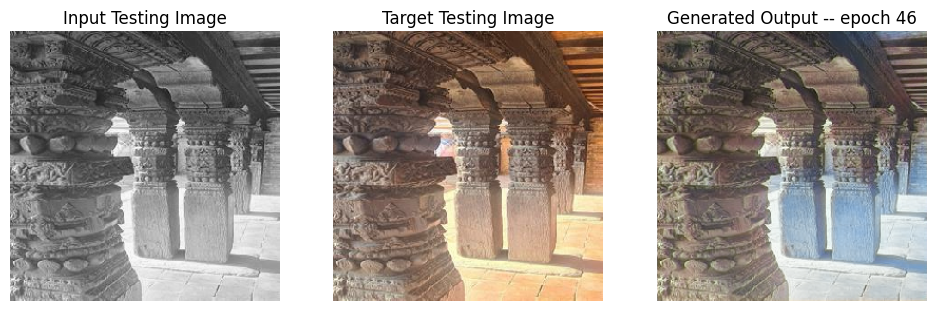

SSIM Score: 0.9664900898933411
PSNR Score: 20.641355514526367
Epoch 46
Training Details
Generator-- total_loss:2.07756 gan_loss:0.00005 l1_loss:0.03212 perceptual_loss:0.00589 Discriminator-- total_loss:44.52475 real_loss:44.52475 generated_loss:0.00000 --- SSIM 0.95299 PSNR 25.48355 LPIPS 0.00000
Time taken for epoch 47 is 526.1655974388123 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.39078 gan_loss:0.00000 l1_loss:0.03643  perceptual_loss:0.00711 Discriminator-- total_loss:42.66582 real_loss:42.66581 generated_loss:0.00000 --- SSIM 0.95246 PSNR 24.89448 LPIPS 0.00000
Time taken for epoch 47 is 615.2545464038849 sec
Number of iteration 140
Epoch 47
Training Details
Generator-- total_loss:2.06330 gan_loss:0.00001 l1_loss:0.03193 perceptual_loss:0.00584 Discriminator-- total_loss:44.60323 real_loss:44.60322 generated_loss:0.00001 --- SSIM 0.95352 PSNR 25.53510 LPIPS 0.00000
Time taken for epoch 48 is 525.5793488025665 sec
Number of iteration 490
Validation Det

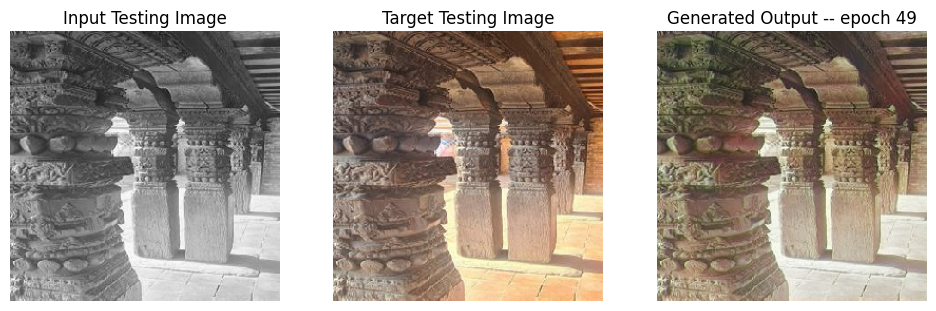

SSIM Score: 0.9773814678192139
PSNR Score: 25.177425384521484
Epoch 49
Training Details
Generator-- total_loss:2.04771 gan_loss:0.00001 l1_loss:0.03170 perceptual_loss:0.00578 Discriminator-- total_loss:44.52274 real_loss:44.52273 generated_loss:0.00000 --- SSIM 0.95412 PSNR 25.59547 LPIPS 0.00000
Time taken for epoch 50 is 528.1049122810364 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.51331 gan_loss:0.00000 l1_loss:0.03851  perceptual_loss:0.00735 Discriminator-- total_loss:43.60518 real_loss:43.60518 generated_loss:0.00000 --- SSIM 0.95049 PSNR 24.39751 LPIPS 0.00000
Time taken for epoch 50 is 616.6584479808807 sec
Number of iteration 140
Epoch 50
Training Details
Generator-- total_loss:2.03780 gan_loss:0.00003 l1_loss:0.03159 perceptual_loss:0.00573 Discriminator-- total_loss:44.45683 real_loss:44.45673 generated_loss:0.00009 --- SSIM 0.95436 PSNR 25.62404 LPIPS 0.00000
Time taken for epoch 51 is 523.7813496589661 sec
Number of iteration 490
Validation Det

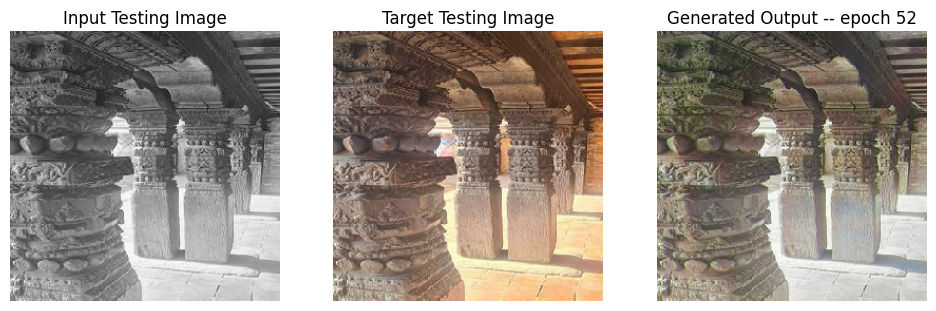

SSIM Score: 0.9739432334899902
PSNR Score: 23.21017837524414
Reduced discriminator learning rate to 0.0003000000142492354 at epoch 52.
Epoch 52
Training Details
Generator-- total_loss:9.02444 gan_loss:6.99846 l1_loss:0.03139 perceptual_loss:0.00570 Discriminator-- total_loss:0.55760 real_loss:0.30689 generated_loss:0.25071 --- SSIM 0.95504 PSNR 25.65891 LPIPS 0.00000
Time taken for epoch 53 is 405.56941080093384 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.53299 gan_loss:0.19404 l1_loss:0.03583  perceptual_loss:0.00685 Discriminator-- total_loss:2.95826 real_loss:2.76289 generated_loss:0.19537 --- SSIM 0.95317 PSNR 25.00576 LPIPS 0.00000
Time taken for epoch 53 is 495.3859622478485 sec
Number of iteration 140
Epoch 53
Training Details
Generator-- total_loss:12.68666 gan_loss:10.65786 l1_loss:0.03141 perceptual_loss:0.00573 Discriminator-- total_loss:0.02438 real_loss:0.01406 generated_loss:0.01032 --- SSIM 0.95496 PSNR 25.65042 LPIPS 0.00000
Time taken for ep

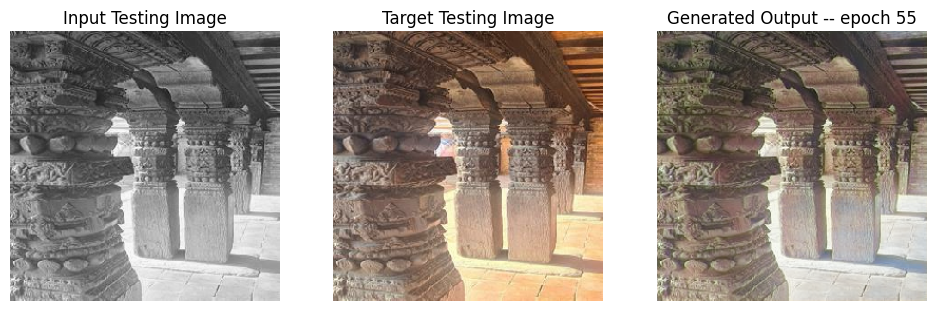

SSIM Score: 0.9745473861694336
PSNR Score: 23.629074096679688
Epoch 55
Training Details
Generator-- total_loss:15.02996 gan_loss:13.00693 l1_loss:0.03137 perceptual_loss:0.00568 Discriminator-- total_loss:0.00560 real_loss:0.00270 generated_loss:0.00290 --- SSIM 0.95511 PSNR 25.65376 LPIPS 0.00000
Time taken for epoch 56 is 394.8423054218292 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.40937 gan_loss:0.06862 l1_loss:0.03585  perceptual_loss:0.00685 Discriminator-- total_loss:4.84172 real_loss:4.77841 generated_loss:0.06331 --- SSIM 0.95323 PSNR 25.00362 LPIPS 0.00000
Time taken for epoch 56 is 487.6778757572174 sec
Number of iteration 140
Epoch 56
Training Details
Generator-- total_loss:15.52102 gan_loss:13.49072 l1_loss:0.03147 perceptual_loss:0.00571 Discriminator-- total_loss:0.01076 real_loss:0.00551 generated_loss:0.00526 --- SSIM 0.95492 PSNR 25.63613 LPIPS 0.00000
Time taken for epoch 57 is 392.6122670173645 sec
Number of iteration 490
Validation Detai

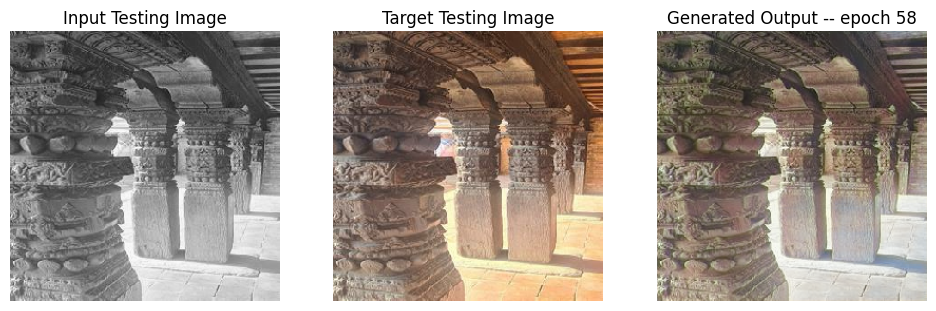

SSIM Score: 0.9744138717651367
PSNR Score: 23.575000762939453
Epoch 58
Training Details
Generator-- total_loss:16.36299 gan_loss:14.34289 l1_loss:0.03129 perceptual_loss:0.00569 Discriminator-- total_loss:0.02538 real_loss:0.01389 generated_loss:0.01149 --- SSIM 0.95514 PSNR 25.67673 LPIPS 0.00000
Time taken for epoch 59 is 396.4475431442261 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.52426 gan_loss:0.18615 l1_loss:0.03581  perceptual_loss:0.00684 Discriminator-- total_loss:4.39385 real_loss:4.15886 generated_loss:0.23499 --- SSIM 0.95321 PSNR 25.01082 LPIPS 0.00000
Time taken for epoch 59 is 489.34788060188293 sec
Number of iteration 140
Epoch 59
Training Details
Generator-- total_loss:18.62337 gan_loss:16.59596 l1_loss:0.03143 perceptual_loss:0.00570 Discriminator-- total_loss:0.00797 real_loss:0.00381 generated_loss:0.00416 --- SSIM 0.95498 PSNR 25.65182 LPIPS 0.00000
Time taken for epoch 60 is 398.23472356796265 sec
Number of iteration 490
Validation Det

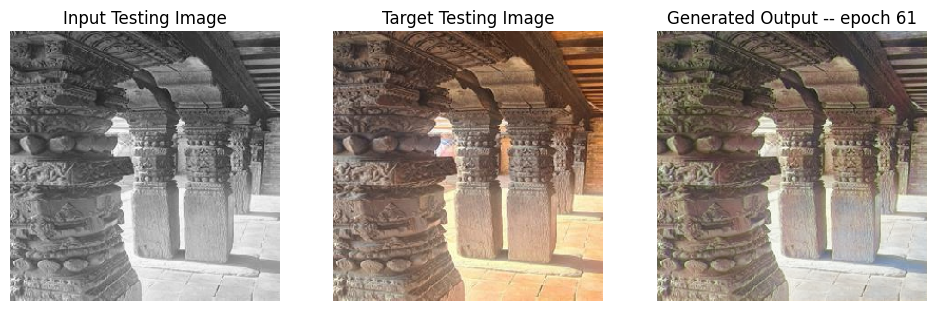

SSIM Score: 0.9745891690254211
PSNR Score: 23.651123046875
Epoch 61
Training Details
Generator-- total_loss:19.15244 gan_loss:17.12355 l1_loss:0.03144 perceptual_loss:0.00571 Discriminator-- total_loss:0.00067 real_loss:0.00032 generated_loss:0.00035 --- SSIM 0.95498 PSNR 25.64556 LPIPS 0.00000
Time taken for epoch 62 is 404.24108815193176 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.39782 gan_loss:0.05925 l1_loss:0.03582  perceptual_loss:0.00685 Discriminator-- total_loss:6.99462 real_loss:6.90892 generated_loss:0.08570 --- SSIM 0.95323 PSNR 25.01123 LPIPS 0.00000
Time taken for epoch 62 is 499.5698263645172 sec
Number of iteration 140
Epoch 62
Training Details
Generator-- total_loss:19.65385 gan_loss:17.62629 l1_loss:0.03142 perceptual_loss:0.00571 Discriminator-- total_loss:0.00390 real_loss:0.00179 generated_loss:0.00211 --- SSIM 0.95499 PSNR 25.64635 LPIPS 0.00000
Time taken for epoch 63 is 404.1795217990875 sec
Number of iteration 490
Validation Details

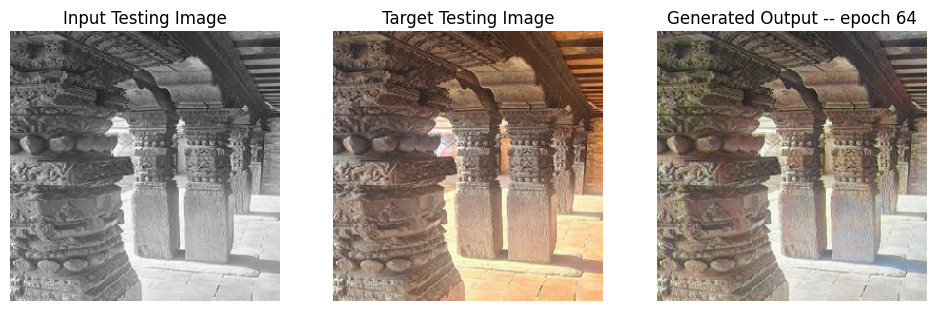

SSIM Score: 0.9743847250938416
PSNR Score: 23.566444396972656
Epoch 64
Training Details
Generator-- total_loss:19.09970 gan_loss:17.07543 l1_loss:0.03137 perceptual_loss:0.00570 Discriminator-- total_loss:0.01893 real_loss:0.01264 generated_loss:0.00629 --- SSIM 0.95500 PSNR 25.65977 LPIPS 0.00000
Time taken for epoch 65 is 406.3606388568878 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.37718 gan_loss:0.03609 l1_loss:0.03586  perceptual_loss:0.00685 Discriminator-- total_loss:8.30503 real_loss:8.22147 generated_loss:0.08356 --- SSIM 0.95322 PSNR 25.00232 LPIPS 0.00000
Time taken for epoch 65 is 501.0914113521576 sec
Number of iteration 140
Epoch 65
Training Details
Generator-- total_loss:19.35253 gan_loss:17.32534 l1_loss:0.03142 perceptual_loss:0.00570 Discriminator-- total_loss:0.00041 real_loss:0.00022 generated_loss:0.00019 --- SSIM 0.95492 PSNR 25.65549 LPIPS 0.00000
Time taken for epoch 66 is 405.8198266029358 sec
Number of iteration 490
Validation Detai

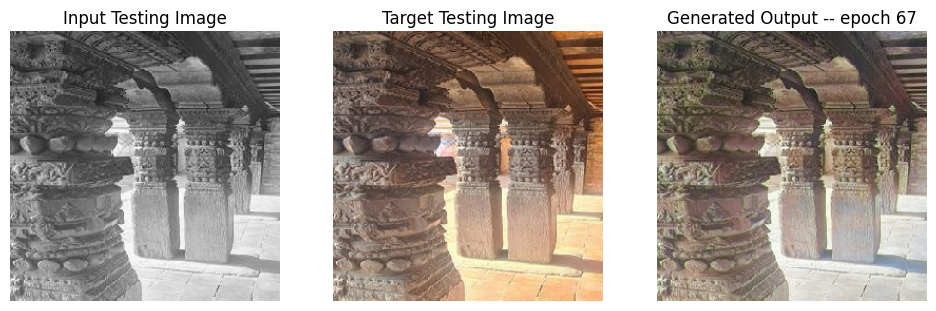

SSIM Score: 0.9746432900428772
PSNR Score: 23.67923927307129
Epoch 67
Training Details
Generator-- total_loss:21.45150 gan_loss:19.42801 l1_loss:0.03134 perceptual_loss:0.00571 Discriminator-- total_loss:0.00054 real_loss:0.00023 generated_loss:0.00031 --- SSIM 0.95498 PSNR 25.67040 LPIPS 0.00000
Time taken for epoch 68 is 404.76493787765503 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.35867 gan_loss:0.02082 l1_loss:0.03581  perceptual_loss:0.00684 Discriminator-- total_loss:11.31981 real_loss:11.28363 generated_loss:0.03618 --- SSIM 0.95320 PSNR 25.00955 LPIPS 0.00000
Time taken for epoch 68 is 500.36662435531616 sec
Number of iteration 140
Epoch 68
Training Details
Generator-- total_loss:21.82202 gan_loss:19.79881 l1_loss:0.03135 perceptual_loss:0.00570 Discriminator-- total_loss:0.00904 real_loss:0.00237 generated_loss:0.00667 --- SSIM 0.95506 PSNR 25.66092 LPIPS 0.00000
Time taken for epoch 69 is 404.0673234462738 sec
Number of iteration 490
Validation De

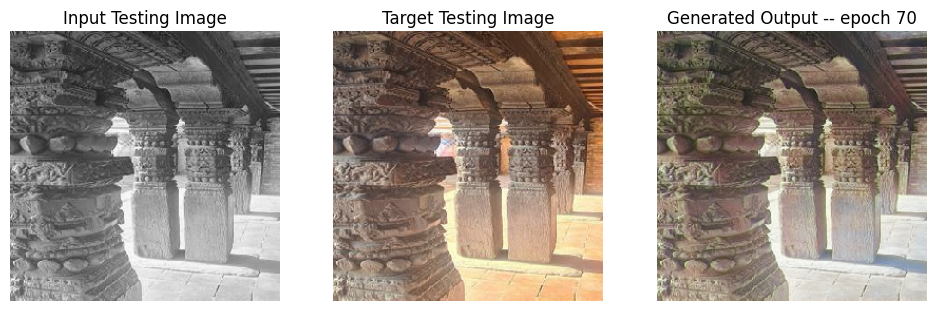

SSIM Score: 0.9746577739715576
PSNR Score: 23.678451538085938
Epoch 70
Training Details
Generator-- total_loss:25.20679 gan_loss:23.18252 l1_loss:0.03137 perceptual_loss:0.00570 Discriminator-- total_loss:0.00869 real_loss:0.00371 generated_loss:0.00497 --- SSIM 0.95498 PSNR 25.65720 LPIPS 0.00000
Time taken for epoch 71 is 404.99223589897156 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.36897 gan_loss:0.02920 l1_loss:0.03583  perceptual_loss:0.00685 Discriminator-- total_loss:9.95967 real_loss:9.93142 generated_loss:0.02824 --- SSIM 0.95321 PSNR 25.00578 LPIPS 0.00000
Time taken for epoch 71 is 500.07576513290405 sec
Number of iteration 140
Epoch 71
Training Details
Generator-- total_loss:25.62962 gan_loss:23.60175 l1_loss:0.03143 perceptual_loss:0.00571 Discriminator-- total_loss:0.00072 real_loss:0.00042 generated_loss:0.00030 --- SSIM 0.95495 PSNR 25.64891 LPIPS 0.00000
Time taken for epoch 72 is 407.1080594062805 sec
Number of iteration 490
Validation Det

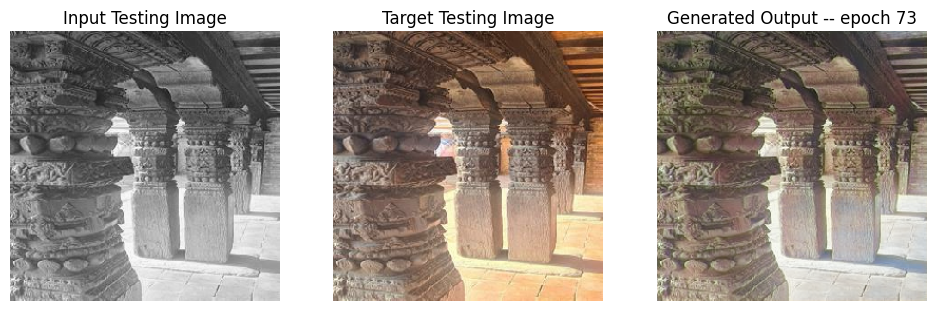

SSIM Score: 0.9746184349060059
PSNR Score: 23.65456199645996
Epoch 73
Training Details
Generator-- total_loss:25.88139 gan_loss:23.85444 l1_loss:0.03140 perceptual_loss:0.00571 Discriminator-- total_loss:0.00029 real_loss:0.00013 generated_loss:0.00017 --- SSIM 0.95495 PSNR 25.65678 LPIPS 0.00000
Time taken for epoch 74 is 398.6525046825409 sec
Number of iteration 490
Validation Details
Generator-- total_loss:2.38784 gan_loss:0.04961 l1_loss:0.03580  perceptual_loss:0.00685 Discriminator-- total_loss:9.26325 real_loss:9.21504 generated_loss:0.04821 --- SSIM 0.95324 PSNR 25.01277 LPIPS 0.00000
Time taken for epoch 74 is 492.4126739501953 sec
Number of iteration 140


In [46]:
fit(train_dataset, epochs, validation_dataset, gen)

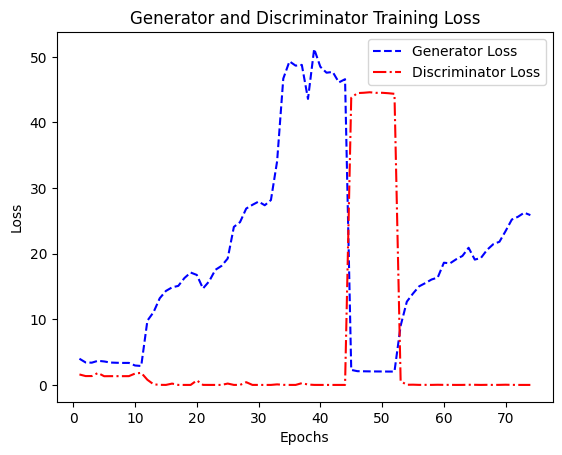

In [47]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

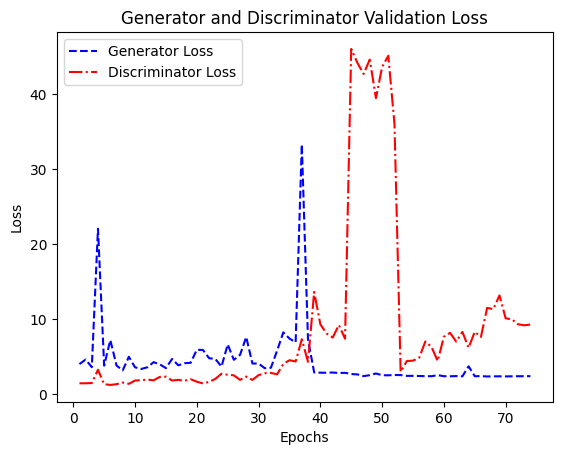

In [48]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

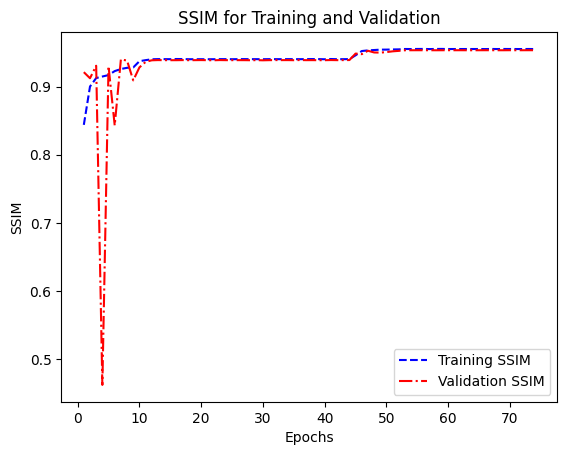

In [49]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.r', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

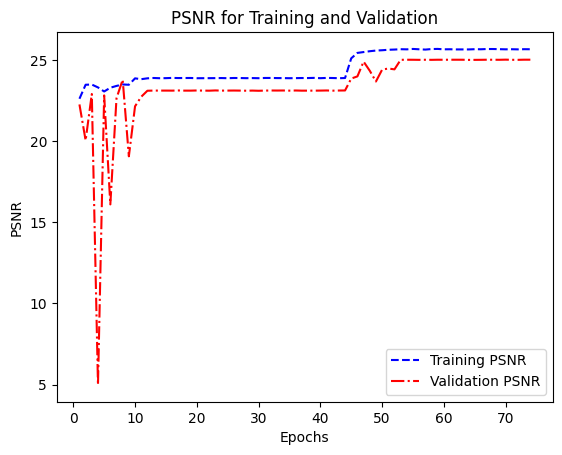

In [50]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.r', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

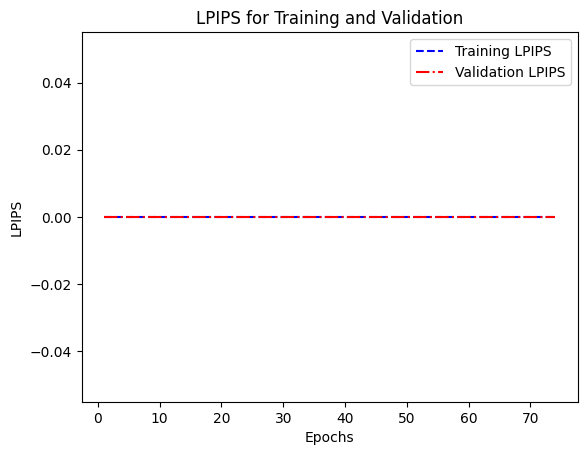

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.r', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

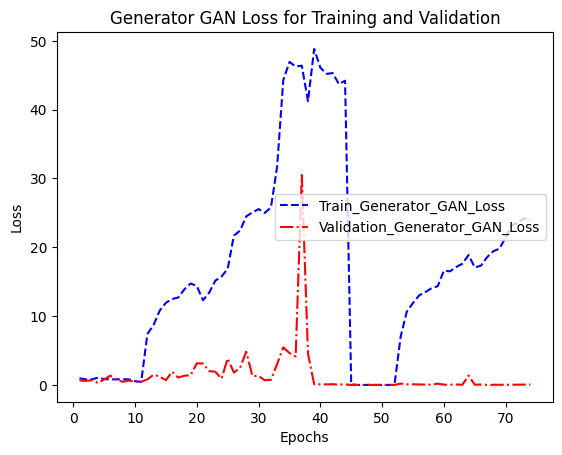

In [52]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

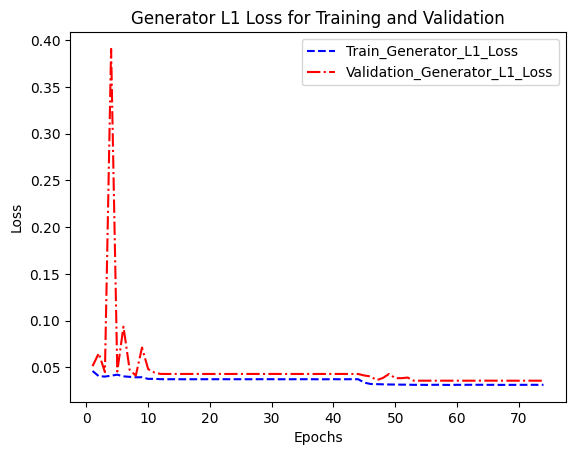

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

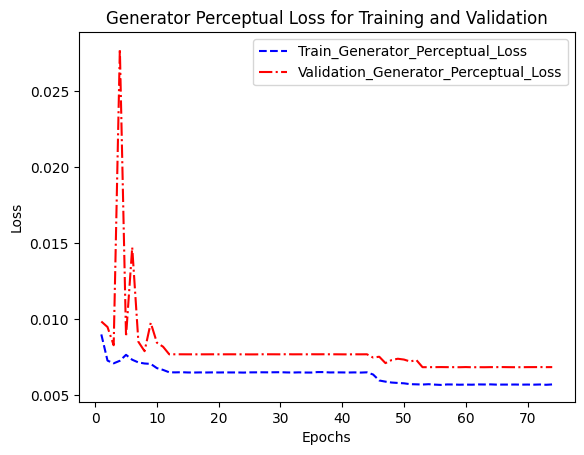

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.r', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

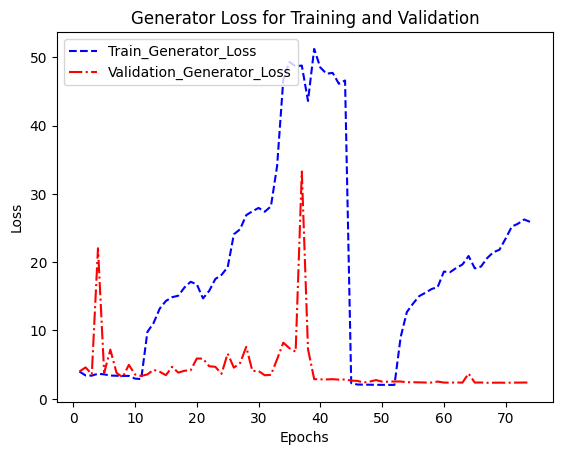

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

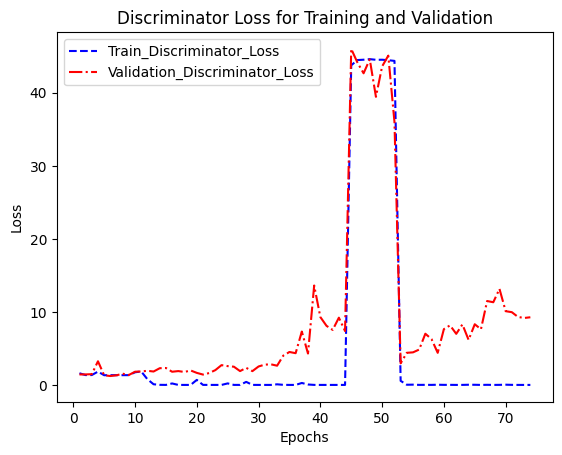

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

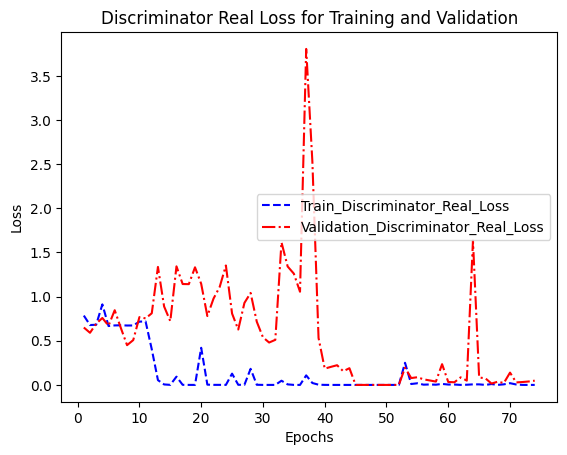

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

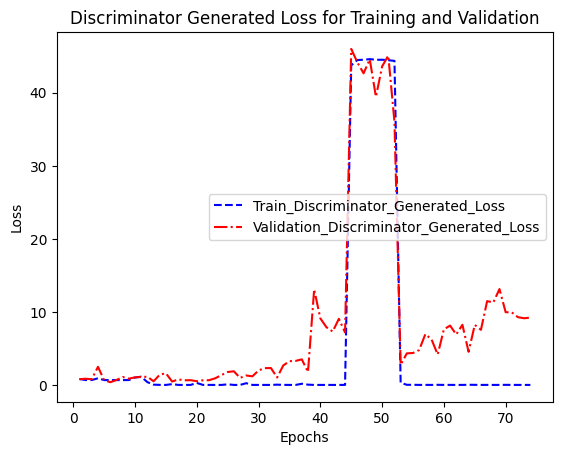

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [59]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [60]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [61]:
os.mkdir('/kaggle/working/modelsFeb7')

In [62]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [63]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [64]:
import subprocess
from IPython.display import FileLink, display

In [65]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip